## Title 
MCMC from Scratch for Linear Regression

## Description :
The aim of this exercise is to perform Monte Carlo Markov Chain (MCMC) from scratch for linear regression. For this, we will be using our old friend the Advertising dataset.

On completing the exercise you should be able to see the following distribution. One for each of the beta value:

<img src="../fig/fig.png" style="width: 500px;">

## Instructions:
- Read the data file Advertising.csv and set the predictor and response variables.
- Fit a linear regression model on the advertising data and take a look at the beta values.
- Create 2 lists to store the beta values and initialize the beta values.
- Define a function get_prior to compute the prior value given the beta values. 
- Compute the likelihood, prior and posterior for the initial beta values.
- For a selected number of sampling "epochs":
    - Compute new beta values
    - Compute the corresponding likelihood, prior and posterior.
    - Compute the exponential ratio of the current and previous posterior.
    - Based on the ratio, select or reject the new beta values.
- Choose a burn rate.
- Plot the histogram of the beta values.

## Hints: 

<a href="https://numpy.org/doc/stable/reference/generated/numpy.log.html" target="_blank">np.log()</a> Computes the natural logarithm, element-wise.

<a href="https://numpy.org/doc/stable/reference/generated/numpy.exp.html?highlight=exp#numpy.exp" target="_blank">np.exp()</a> Calculates the exponential of all elements in the input array.

<a href="https://www.google.com/search?q=sklearn+linear+gressiogn&rlz=1C5CHFA_enIN777IN777&oq=sklearn+linear+gressiogn&aqs=chrome..69i57j69i59l2j0i271j69i60.3137j0j7&sourceid=chrome&ie=UTF-8" target="_blank">LinearRegression()</a> Initiates an ordinary least squares Linear Regression.

<a href="https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html?highlight=linear%20regression#sklearn.linear_model.LinearRegression.fit" target="_blank">.fit()</a> Fits the linear model to the data.

<a href="https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html" target="_blank">model.coef_</a> Estimated coefficients for the linear regression problem

<a href="https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html" target="_blank">model.intercept_</a> Independent term in the linear model.

<a href="https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html?highlight=random%20normal#numpy.random.normal" target="_blank">np.random.normal()</a> Draw random samples from a normal (Gaussian) distribution.

<a href="https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.norm.html" target="_blank">norm.pdf()</a> A normal continuous random variable.

<a href="https://numpy.org/doc/stable/reference/generated/numpy.sum.html?highlight=sum" target="_blank">np.sum()</a> Sum of array elements over a given axis.

<a href="https://numpy.org/doc/stable/reference/random/generated/numpy.random.uniform.html?highlight=random%20uniform" target="_blank">np.random.uniform()</a> Draw samples from a uniform distribution.

In [1661]:
# Import necessary libraries
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
%matplotlib inline
from scipy import stats
from scipy.stats import norm


In [1662]:
# Read the data file 'Advertising.csv'
df = pd.read_csv("../data/Advertising.csv")

# Use the column "tv" as the predictor
x = df[['TV']]

# Use the column "sales" as the response
y = df.Sales.values

In [1663]:
# Take a quick look at the data
df.head()

,TV,Radio,Newspaper,Sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


In [1664]:
# Initiate a Linear Regression model
model = LinearRegression()

# Fit the model on the predictor and response data
model.fit(x,y)

LinearRegression()

In [1665]:
# Take a quick look at the beta values got after model fitting
# Use the model.intercept_ and model.coef_ for this
b0 = model.intercept_   
b1 = model.coef_
print("Beta0 is",b0)
print("Beta1 is", b1)

Beta0 is 7.032593549127695
Beta1 is [0.04753664]


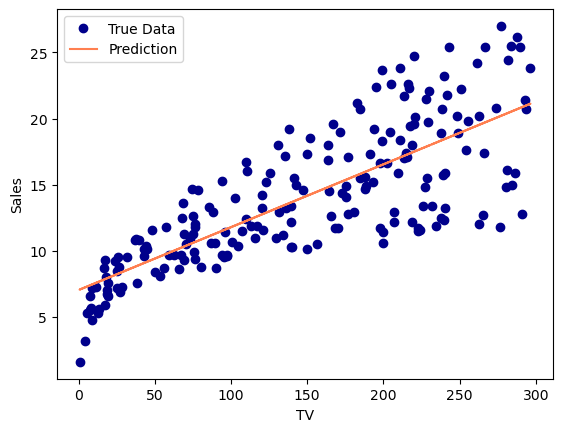

In [1666]:
# Helper code to plot the true and predicted data
plt.plot(x,y,'o', label="True Data", color='darkblue')
plt.plot(x,model.predict(df[['TV']]), label="Prediction", color='coral')
plt.xlabel("TV")
plt.ylabel("Sales")
plt.legend()

In [1667]:
# Define 2 empty lists to store the accepted beta values in a list 
beta0_list = []
beta1_list = []

In [1668]:
# Initialize beta0 to a resonable value based on the model parameter seen above
beta0 =0

# Initialize beta1 to a resonable value based on the model parameter seen above
beta1 =0


In [1669]:
norm.pdf(0, loc=7.5, scale=3)

0.005842766831189513

In [1670]:
# Function to get the prior given the beta0 and beta1 values
# NOTE - All the computations are done in the log space so that the numbers are managable.
def get_log_prior(beta0,beta1):
    
    # The prior of beta0 is a value from a normal PDF of beta0 with mean as 100 and standard deviation as 50
    # Take the log of these value  
    log_prior_b0 = np.log(norm.pdf(beta0, 7, 5))

    # WRONG!!!! log_prior_b0 = np.log(np.random.normal(5,1))
    # this just get a random number from the normal distribution
    # should calculate p(theta), which is to compute the probability density at a specific point beta0 with specific normal distribution
    
    # The prior of beta1 is a value from a normal PDF of beta1 with mean as 1 and standard deviation as 1
    # Take the log of this value 
    log_prior_b1 = np.log(norm.pdf(beta1, 0,0.1))
    
    # Compute the prior as the sum of the log priors of beta0 and beta1
    log_prior = log_prior_b0 + log_prior_b1
  
    # Return the prior value
    return log_prior

In [1671]:
beta1*x  + beta0

,TV
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
195,0.0
196,0.0
197,0.0
198,0.0


In [1672]:
np.log( (y.reshape(-1,1)  - np.array( beta1*x  + beta0))**2)

array([[6.19115522],
       [4.68361161],
       [4.4600288 ],
       [5.83554146],
       [5.11445462],
       [3.94816205],
       [4.93619906],
       [5.16043366],
       [3.13723184],
       [4.721708  ],
       [4.30352441],
       [5.71294041],
       [4.43840697],
       [4.54425177],
       [5.88887796],
       [6.21812192],
       [5.05145729],
       [6.38916626],
       [4.84960545],
       [5.36204306],
       [5.78074352],
       [5.05145729],
       [3.4455332 ],
       [5.48168005],
       [4.54425177],
       [4.9698133 ],
       [5.4161004 ],
       [5.53263822],
       [5.87832384],
       [4.70275051],
       [6.12678184],
       [4.9530768 ],
       [4.5235262 ],
       [5.71294041],
       [4.5025836 ],
       [5.09889034],
       [6.46949835],
       [5.37569499],
       [4.62507085],
       [6.13610587],
       [5.61880539],
       [5.67815693],
       [6.0602674 ],
       [5.11445462],
       [4.28013233],
       [5.40272243],
       [4.721708  ],
       [6.288

In [1673]:
# Compute the log-likelihood for the initial beta values 
# !!!!!!!!!!!
# pay attention to the dimensions of y and x. 

# WRONG log_likelihood = - np.sum( np.log( (y.reshape(-1,1)  - np.array( beta1*x  + beta0))**2) )
log_likelihood = - np.log( np.sum( (y.reshape(-1,1)  - np.array( beta1*x  + beta0))**2) )

# Get the prior of the intial beta values by calling the get_log_prior function
log_prior = get_log_prior(beta0, beta1)

# Compute the log posterior of the initial beta values
# The posterior is the sum of the log_likelihood and log_prior
# should be p(data|theta) * p(theta), but bc it's log, do the sum
log_posterior = log_likelihood + log_prior


In [1674]:
# Save the initial posterior value as prev_posterior for comparision later
prev_logposterior = log_posterior

# Append the initial beta values i.e. beta0 and beta1 to the list
beta0_list.append(beta0)
beta1_list.append(beta1)

In [1675]:
# Specify the number of sampling "epochs" (less than 500k)
epochs = 100000


### ⏸ How does the number of samples generated affect results of MCMC?

#### A. As the number of samples are increased the beta values chosen grow increasing random.
#### B. For a smaller number of samples the beta values are closer to the true value with reduced randomness.
#### C. The number of samples does not affect the beta values, it only depends on the prior.
#### D. As the number of samples increase, the beta values slowly converge to their true values.

In [1676]:
### edTest(test_chow1) ###
# Submit an answer choice as a string below (eg. if you choose option C, put 'C')
answer1 = 'D'

In [1677]:
current_beta0 = beta0
current_beta1 = beta1

In [1678]:
# Loop over the range of sampling "epochs"
for i in range(epochs):

    # Get a new beta1 value with mean as the latest element beta1 and scale as 0.1
    beta0 = np.random.normal(current_beta0, 0.5)

    # Get a new beta0 value with mean as the latest element beta0 and scale as 0.5
    beta1 = np.random.normal(current_beta1, 0.1)

    # Get the prior values for the new beta values by calling the get_log_prior function
    log_prior = get_log_prior(beta0, beta1)
    
    # Compute P(data|w) i.e. the log-likelihood for all the data points
    log_likelihood = - np.log( np.sum( (y.reshape(-1,1)  - np.array( beta1*x  + beta0))**2) )
    
    # To compute the posterior given the likelihood and prior
    # The posterior is the sum of the likelihood and prior
    log_posterior = log_prior+log_likelihood
    

    # Compute the the exponential of the ratio of the posterior given its previous value
    # Since it is the log, the ratio is computed as the difference between the values
    exp_ratio = np.exp(log_posterior-prev_logposterior)
    print(beta0, beta1, current_beta0, current_beta1, log_prior, log_likelihood, log_posterior, prev_logposterior,exp_ratio)

    # If the ratio is greater than 1 then accept the new beta values in this case
    if exp_ratio>1:

        # Append the beta0 and beta1 to the beta list values
        beta0_list.append(beta0)
        beta1_list.append(beta1)

        # Save the accepted posterior as the previous posterior
        prev_logposterior = log_posterior
        current_beta0 = beta0
        current_beta1 = beta1

    # If the ratio is less than 1 then get a random value between 0 and 1
    else:
        coin = np.random.uniform(0,1)

        # Set a threshold value
        threshold = exp_ratio
        
        # Check if the random value is higher than the threshold
        # Append the beta values to the list and update the previous posterior
        # !!!!!!!!!!!!! if coin > 1-threshold
        if coin < threshold:
            beta0_list.append(beta0)
            beta1_list.append(beta1)
            prev_logposterior = log_posterior
            current_beta0 = beta0
            current_beta1 = beta1


-0.43110762623950244 0.08994469365198098 0 0 -2.6536594927119332 -8.52557318487325 -11.179232677585183 -12.83342576018638 5.228858962151603
-1.2279224702838079 0.1935464789983209 -0.43110762623950244 0.08994469365198098 -4.371716026021798 -11.131221493726166 -15.502937519747963 -11.179232677585183 0.013250700736658272
0.05069932160194618 0.03285595770657256 -0.43110762623950244 0.08994469365198098 -2.164561182065877 -9.858945006450698 -12.023506188516574 -11.179232677585183 0.42986954032053454
-0.9925914000891647 0.20584223326751117 -0.43110762623950244 0.08994469365198098 -4.540911481452809 -11.354978696010582 -15.89589017746339 -11.179232677585183 0.008945027390913296
-0.9207985589983745 0.2514913244283352 -0.43110762623950244 0.08994469365198098 -5.561905195229922 -11.984434399567094 -17.54633959479702 -11.179232677585183 0.0017171198161913019
-0.7861509397368163 0.2688457303860736 -0.43110762623950244 0.08994469365198098 -5.97111415231776 -12.186840289458127 -18.157954441775885 -11

### ⏸ If the threshold is set to a higher value, new beta values are rejected more often if they do not improve the convergence to the true value

### The statement above is:

#### A. True for all cases
#### B. False for all cases
#### C. True only when the number of samples is less
#### D. True only when prior is extremely far from the real value

In [1679]:
### edTest(test_chow2) ###
# Submit an answer choice as a string below (eg. if you choose option C, put 'C')
answer2 = 'A'

In [1680]:
# The number of data points to consider after the beta list has been populated
burn_rate = int(len(beta0_list)*0.3)


In [1681]:
### edTest(test_chow3) ###
# Check posterior mean for beta0 and beta1 
print(np.mean(beta0_list[burn_rate:]), np.mean(beta1_list[burn_rate:]))


6.577933755380257 0.036480789423416156


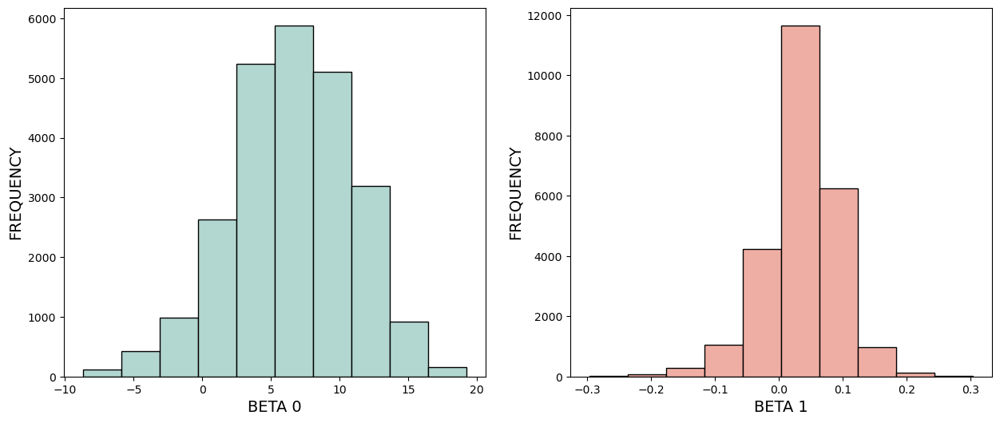

In [1682]:
# Helper code to plot the histogram of the beta values

# Plot the histogram of the beta0 values
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.hist(beta0_list[burn_rate:], color='#B2D7D0',edgecolor="black", linewidth=1)
ax1.set_xlabel("BETA 0", fontsize=14)
ax1.set_ylabel("FREQUENCY", fontsize=14);

# Plot the histogram of the beta1 values
ax2.hist(beta1_list[burn_rate:], color='#EFAEA4',edgecolor="black", linewidth=1)
ax2.set_xlabel("BETA 1", fontsize=14)
ax2.set_ylabel("FREQUENCY", fontsize=14);